## Notebook used to understand the data

In [ ]:
import numpy as np
import astropy as ap
import matplotlib.pyplot as plt
import seaborn as sns
import copy
import sys

from astropy.table import QTable
import astropy.units as u

import read_mist_models

### Isochrones

In [42]:
with open("data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt", 'r') as f:
    lines = f.readlines()

print(len(lines))

for i in range(0, 5000, 1):
    print(lines[i])


104530
# MIST version number  = 1.2     

# MESA revision number =     7503

# --------------------------------------------------------------------------------------

#  Yinit        Zinit   [Fe/H]   [a/Fe]  v/vcrit                                        

# 0.2703  1.42857E-02     0.00     0.00     0.00

# --------------------------------------------------------------------------------------

# number of isochrones =   107

# --------------------------------------------------------------------------------------

# number of EEPs, cols =   271   25

#   1                               2                               3                               4                               5                               6                               7                               8                               9                              10                              11                              12                              13                              14                       

l'âge de l'isochrone commence à 100 000 ans et augmente de ~12 000 ans à chaque incrément jusqu'à atteindre 1.99526e+10 ans (19.9526 milliards d'années)

le nombre de EEP (equivalent evolutionary point) tracks par isochrone augmente à chaque incrément du log10 de l'âge, pourquoi?


### Données intéressantes

- dans nom du fichier : [Fe/H] => la métallicité (le paramètre qui change entre tous les fichiers, de +0.50 à -4.00)
- colonne 2 : log10_isochrone_age_yr => âge de l'isochrone en log années
- (colonne 4 : star_mass => masse de l'étoile en masse solaire (masse juqu'à 3-5 nous intéresse))
- (colonne 8 : log_L => log luminosité bolométrique en luminosité solaire)
- colonne 11 : log_Teff => log température effective en Kelvin
- colonne 13 : log_g => log gravité de surface en cm*s<sup>-2</sup>
- (colonne 25 : phase => le type de phase de l'étoile défini par : -1=PMS, 0=MS, 2=RGB, 3=CHeB, 4=EAGB, 5=TPAGB, 6=postAGB, 9=WR)

In [9]:
iso_test = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.50_afe_p0.0_vvcrit0.0_basic.txt')

infos = iso_test.read_iso_file()

for data in infos:
    print(data)

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.50_afe_p0.0_vvcrit0.0_basic.txt
{'MIST': '1.2', 'MESA': '7503'}
{'Yinit': 0.3163, 'Zinit': 0.0451753, '[Fe/H]': 0.5, '[a/Fe]': 0.0}
0.0
[np.float64(5.0), np.float64(5.05), np.float64(5.1), np.float64(5.15), np.float64(5.2), np.float64(5.25), np.float64(5.3), np.float64(5.35), np.float64(5.4), np.float64(5.45), np.float64(5.5), np.float64(5.55), np.float64(5.6), np.float64(5.65), np.float64(5.7), np.float64(5.75), np.float64(5.8), np.float64(5.8500000000000005), np.float64(5.9), np.float64(5.95), np.float64(6.0), np.float64(6.050000000000001), np.float64(6.1000000000000005), np.float64(6.15), np.float64(6.2), np.float64(6.25), np.float64(6.300000000000001), np.float64(6.3500000000000005), np.float64(6.4), np.float64(6.45), np.float64(6.5), np.float64(6.550000000000001), np.float64(6.6000000000000005), np.float64(6.65), np.float64(6.7), np.float64(6.75), np.float64(6.800000000000001), np.float64(6.8500000000000005), np.floa

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.txt
[3.49658903 3.49668886 3.49822443 ... 4.7017784  4.69415116 4.68655345]


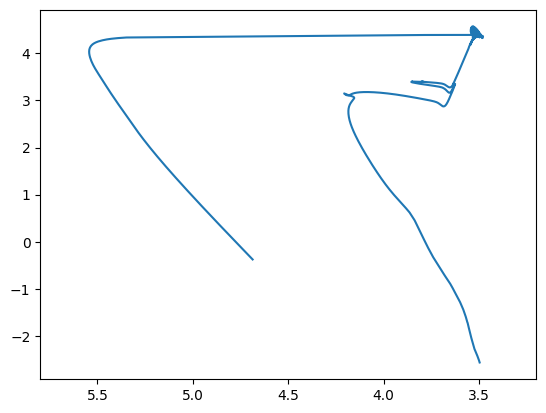

In [ ]:
iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.txt')

age_ind = iso.age_index(8.0)

logTeff = iso.isos[age_ind]['log_Teff']
print(logTeff)

logL = iso.isos[age_ind]['log_L']

plt.xlim(5.8, 3.2)
plt.plot(logTeff, logL)

plt.show()

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt


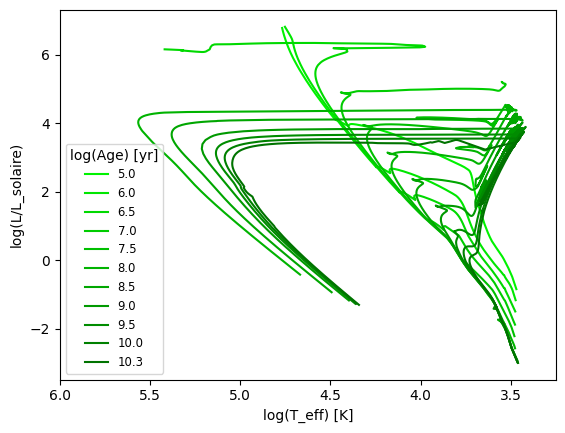

In [ ]:
# V1 sans pandas

iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

ages = [5.0, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0, 10.3]
colors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55]
# utiliser ça (https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range) pour normaliser si besoin

for i, age in enumerate(ages):
    age_ind = iso.age_index(age)
    logTeff = iso.isos[age_ind]['log_Teff']
    # print(age_ind)
    # print(iso.isos[age_ind])
    # print(iso.isos[age_ind]['log_Teff'])
    # break
    
    logL = iso.isos[age_ind]['log_L']

    plt.plot(logTeff, logL, label=f"{age}", c=(0, # 0.5-colors[i] if 0.5-colors[i]>0 else 0,
                                               1-colors[i], # 0.5-colors[i] if 0.5-colors[i]>0 else 0, 
                                               0))

plt.xlim(6, 3.25)
plt.xlabel("log(T_eff) [K]")
plt.ylabel("log(L/L_solaire)")
plt.legend(title="log(Age) [yr]", fontsize="small")
plt.show()

#### Mettre les données dans les tables

In [12]:
# exemple

a = np.array([1, 4, 5], dtype=np.int32)
b = [2.0, 5.0, 8.5]
c = ['x', 'y', 'z']
d = [10, 20, 30] * u.m / u.s

t = QTable([a, b, c, d],
           names=('a', 'b', 'c', 'd'),
           meta={'name': 'first table'})

t.info
print(t)

 a   b   c    d  
            m / s
--- --- --- -----
  1 2.0   x  10.0
  4 5.0   y  20.0
  5 8.5   z  30.0


In [ ]:
# création de une table par age
iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

isos_data = []
for iso_ind in range(len(iso.isos)):
    logTeff = iso.isos[iso_ind]['log_Teff']
    logL = iso.isos[iso_ind]['log_L']
    log_g = iso.isos[iso_ind]['log_g']
    t = QTable([logTeff, logL, log_g],
           names=('logTeff', 'logL', 'log_g'),
           meta={'name': f"iso age {iso.isos[age_ind]['log10_isochrone_age_yr'][0]}"})
    isos_data.append(t.copy())

print(isos_data[0])

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt
     logTeff               logL              log_g       
------------------ ------------------- ------------------
3.4685410950939577 -0.8496952161361735  3.116651462997313
 3.469176422523654 -0.8396429021164937   3.11404210672383
3.4711160413528623 -0.8089438206169329 3.1061332305144638
3.4730352483724785 -0.7785635954667783 3.0984168687617104
 3.474944293275982 -0.7483679008494489 3.0908753040092383
3.4768367646597858 -0.7184353117899261 3.0835244726266504
 3.478709566027834 -0.6888117970457147 3.0763774543169644
 3.480566492429194 -0.6594253968508426  3.069404489127999
 3.482408695407301 -0.6302573711407673 3.0626116125825877
 3.484230014089774 -0.6013636407419086 3.0559923061288554
               ...                 ...                ...
4.7402734345513435   6.316050211478551 4.1624359200071375
 4.741872006393486   6.338894609254394  4.160661006297343
 4.746095902183563  6.40151258420

In [58]:
# création d'une table avec tout
def get_iso_data_panda(file):
    iso = read_mist_models.ISO(file)

    age = []
    logTeff = []
    logL = []
    log_g = []
    for iso_ind in range(len(iso.isos)):
        age.extend(iso.isos[iso_ind]['log10_isochrone_age_yr'])
        logTeff.extend(iso.isos[iso_ind]['log_Teff'])
        logL.extend(iso.isos[iso_ind]['log_L'])
        log_g.extend(iso.isos[iso_ind]['log_g'])

    iso_data_all = QTable([age, logTeff, logL, log_g],
                        names=('age', 'logTeff', 'logL', 'log_g'),
                        meta={'name': "iso data"})
    # print(iso_data_all.info)
    # print(iso_data_all)
    # display(iso_data_all.to_pandas())
    return iso_data_all.to_pandas()

In [ ]:
# V2 avec pandas => pas intéressant

iso_data = get_iso_data_panda('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

print(iso_data.age.unique())

print(iso_data.loc[iso_data['age'] == 5.15])

sys.exit(1)

ages = [5.0, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0, 10.3]
colors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55]
# utiliser ça (https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range) pour normaliser si besoin

for i, age in enumerate(ages):
    age_ind = iso.age_index(age)
    logTeff = iso.isos[age_ind]['log_Teff']
    
    logL = iso.isos[age_ind]['log_L']

    plt.plot(logTeff, logL, label=f"{age}", c=(0, # 0.5-colors[i] if 0.5-colors[i]>0 else 0,
                                               1-colors[i], # 0.5-colors[i] if 0.5-colors[i]>0 else 0, 
                                               0))

plt.xlim(6, 3.25)
plt.xlabel("log(T_eff) [K]")
plt.ylabel("log(L/L_solaire)")
plt.legend(title="log(Age) [yr]", fontsize="small")
plt.show()

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt
[ 5.    5.05  5.1   5.15  5.2   5.25  5.3   5.35  5.4   5.45  5.5   5.55
  5.6   5.65  5.7   5.75  5.8   5.85  5.9   5.95  6.    6.05  6.1   6.15
  6.2   6.25  6.3   6.35  6.4   6.45  6.5   6.55  6.6   6.65  6.7   6.75
  6.8   6.85  6.9   6.95  7.    7.05  7.1   7.15  7.2   7.25  7.3   7.35
  7.4   7.45  7.5   7.55  7.6   7.65  7.7   7.75  7.8   7.85  7.9   7.95
  8.    8.05  8.1   8.15  8.2   8.25  8.3   8.35  8.4   8.45  8.5   8.55
  8.6   8.65  8.7   8.75  8.8   8.85  8.9   8.95  9.    9.05  9.1   9.15
  9.2   9.25  9.3   9.35  9.4   9.45  9.5   9.55  9.6   9.65  9.7   9.75
  9.8   9.85  9.9   9.95 10.   10.05 10.1  10.15 10.2  10.25 10.3 ]
       age   logTeff      logL     log_g
816   5.15  3.469250 -0.895256  3.165046
817   5.15  3.470837 -0.870787  3.159459
818   5.15  3.472713 -0.841818  3.152934
819   5.15  3.474571 -0.813118  3.146594
820   5.15  3.476409 -0.784700  3.140447
...  

SystemExit: 1

C:\Users\antoi\AppData\Roaming\Python\Python312\site-packages\IPython\core\interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


### Evolutionary tracks

faire le graphe avec d'autres couleurs pour les phases

Reading in: data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt
107
0
0
0
0
0
0
0
0
0
0
0


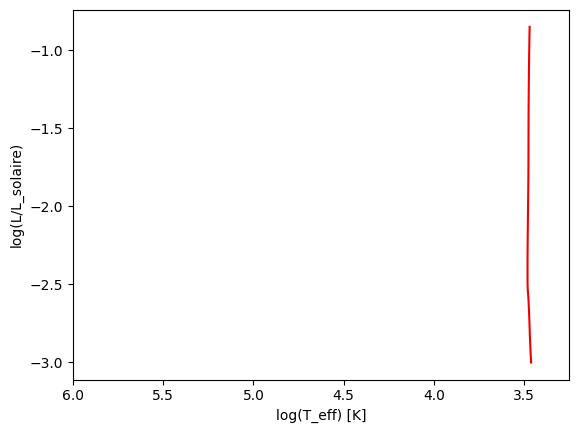

In [90]:
iso = read_mist_models.ISO('data/MIST_v1.2_vvcrit0.0_basic_isos/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.txt')

masses = [0.1, 0.4, 0.8, 1.5, 2.4, 4.0, 8.0, 16.0, 30.0, 60.0, 100.0, 250.0]
colors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.40, 0.45, 0.5, 0.55, 0.6]
# utiliser ça (https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range) pour normaliser si besoin

for i, mass in enumerate(masses):
    logTeff = []
    logL = []
    for iso_ind in range(len(iso.isos)):
        for data in iso.isos[iso_ind]:
            if data["initial_mass"] == mass:
                logTeff.append(data["log_Teff"])
                logL.append(data["log_L"])

    # age_ind = iso.age_index(age)
    # logTeff = iso.isos[age_ind]['log_Teff']

    # logL = iso.isos[age_ind]['log_L']

    plt.plot(logTeff, logL, label=f"{age}", c=(1-colors[i], # 0.5-colors[i] if 0.5-colors[i]>0 else 0,
                                               0, # 0.5-colors[i] if 0.5-colors[i]>0 else 0, 
                                               0))
    print(len(logTeff))
    #print(len(logL))

plt.xlim(6, 3.25)
plt.xlabel("log(T_eff) [K]")
plt.ylabel("log(L/L_solaire)")
# plt.legend(title="log(Age) [yr]", fontsize="small")
plt.show()

Reading in: data/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_EEPS/00010M.track.eep


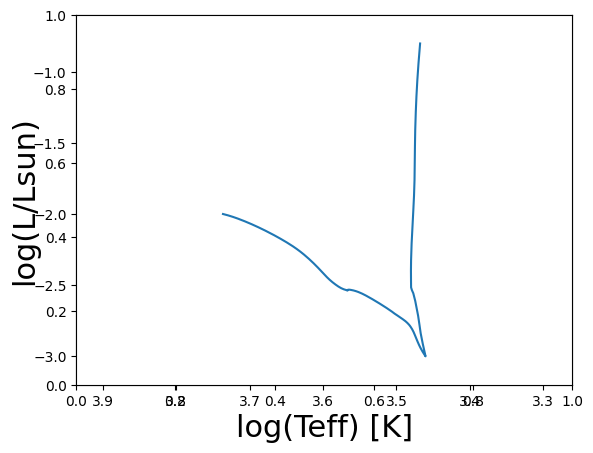

In [ ]:
masses = [0.1, 0.4, 0.8, 1.5, 2.4, 4.0, 8.0, 16.0, 30.0, 60.0, 100.0, 250.0]
masses_str = ["00010", "00040", "00080", "00150", "00240", "00400", "00800", "01600", "03000", "06000", "10000", "25000"]

for i, mass in enumerate(masses):
    track = read_mist_models.EEP('data/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_EEPS/00010M.track.eep')

track.plot_HR()